In [21]:
# ============================================================================
# CELL 1: INSTALLATION (RUN THIS FIRST!)
# ============================================================================

!pip install ultralytics --quiet
!pip install deep-sort-realtime --quiet
!pip install opencv-python-headless --quiet

print("✅ Installation complete!")

✅ Installation complete!
You can now run the next cells.


In [1]:
# ============================================================================
# CELL 1: INSTALLATION (RUN THIS FIRST!)
# ============================================================================

# For Mask R-CNN (optional - takes longer to install)
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git' --quiet

print("✅ Installation complete!")

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 6.5 MB/s eta 0:00:00
✅ Installation complete!


In [22]:
# ============================================================================
# CELL 2: VERIFY INSTALLATION
# ============================================================================

import sys
import subprocess

def check_installation():
    """Verify all packages are installed"""
    required = ['ultralytics', 'deep_sort_realtime', 'cv2', 'torch']
    
    print("Checking installed packages...")
    for package in required:
        try:
            __import__(package)
            print(f"✅ {package} installed")
        except ImportError:
            print(f"❌ {package} NOT installed")
            return False
    
    print("\n✅ All required packages are ready!")
    return True

check_installation()

Checking installed packages...
✅ ultralytics installed
✅ deep_sort_realtime installed
✅ cv2 installed
✅ torch installed

✅ All required packages are ready!


True

In [23]:
# ============================================================================
# CELL 3: IMPORTS AND BASIC SETUP
# ============================================================================

import cv2
import numpy as np
import time
from collections import defaultdict
import matplotlib.pyplot as plt
from pathlib import Path
import torch

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
print(f"OpenCV version: {cv2.__version__}")

# Import YOLO and DeepSORT
try:
    from ultralytics import YOLO
    from deep_sort_realtime.deepsort_tracker import DeepSort
    print("✅ YOLOv8 and DeepSORT ready!")
except ImportError as e:
    print(f"❌ Import error: {e}")

PyTorch version: 2.8.0+cu126
CUDA available: True
OpenCV version: 4.12.0
✅ YOLOv8 and DeepSORT ready!


In [24]:
# ============================================================================
# CELL 4: DEFINE DETECTOR CLASSES
# ============================================================================

class YOLOv8Detector:
    """YOLOv8 object detector wrapper"""
    
    def __init__(self, model_path='yolov8n.pt', conf_threshold=0.5):
        """
        Initialize YOLOv8 detector
        
        Args:
            model_path: Path to YOLOv8 model (yolov8n.pt, yolov8s.pt, etc.)
            conf_threshold: Confidence threshold for detections
        """
        print(f"Loading YOLOv8 model: {model_path}")
        self.model = YOLO(model_path)
        self.conf_threshold = conf_threshold
        print("✅ YOLOv8 model loaded!")
        
    def detect(self, frame):
        """
        Detect objects in frame
        
        Args:
            frame: Input image (BGR format)
            
        Returns:
            detections: List of [x1, y1, x2, y2, confidence, class_id]
        """
        results = self.model(frame, conf=self.conf_threshold, verbose=False)
        detections = []
        
        for result in results:
            boxes = result.boxes
            for box in boxes:
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                conf = float(box.conf[0])
                cls = int(box.cls[0])
                detections.append([x1, y1, x2, y2, conf, cls])
                
        return detections

print("✅ YOLOv8Detector class defined!")

✅ YOLOv8Detector class defined!


In [2]:
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg

class MaskRCNNDetector:
    def __init__(self, conf_threshold=0.5):
        cfg = get_cfg()
        cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
        cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
        cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = conf_threshold
        self.predictor = DefaultPredictor(cfg)
    
    def detect(self, frame):
        outputs = self.predictor(frame)
        boxes = outputs["instances"].pred_boxes.tensor.cpu().numpy()
        scores = outputs["instances"].scores.cpu().numpy()
        classes = outputs["instances"].pred_classes.cpu().numpy()
        masks = outputs["instances"].pred_masks.cpu().numpy()  # ← critical for segmentation!
        
        detections = []
        for i in range(len(boxes)):
            x1, y1, x2, y2 = boxes[i]
            detections.append([x1, y1, x2, y2, scores[i], classes[i], masks[i]])
        return detections

print("✅ MaskRCNNDetector class defined!")

✅ MaskRCNNDetector class defined!


In [25]:
# ============================================================================
# CELL 5: DEFINE TRACKER CLASS
# ============================================================================

class ObjectTracker:
    """Object tracker using DeepSORT"""
    
    def __init__(self, detector):
        """
        Initialize object tracker
        
        Args:
            detector: Detector object (YOLOv8Detector or MaskRCNNDetector)
        """
        self.detector = detector
        self.tracker = DeepSort(max_age=30, n_init=3, max_iou_distance=0.7)
        
        # Performance metrics
        self.metrics = {
            'total_frames': 0,
            'total_detections': 0,
            'fps_history': [],
            'detection_time': [],
            'tracking_time': []
        }
        
        # Track history for visualization
        self.track_history = defaultdict(lambda: [])
        
    def process_frame(self, frame):
        """
        Process a single frame: detect and track objects
        
        Args:
            frame: Input frame (BGR format)
            
        Returns:
            annotated_frame: Frame with bounding boxes and IDs
            tracks: List of tracked objects
        """
        # Detection
        detect_start = time.time()
        detections = self.detector.detect(frame)
        detect_time = time.time() - detect_start
        
        # Convert detections to DeepSORT format
        deepsort_detections = []
        for det in detections:
            x1, y1, x2, y2, conf, cls = det
            bbox = [x1, y1, x2 - x1, y2 - y1]
            deepsort_detections.append((bbox, conf, cls))
        
        # Tracking
        track_start = time.time()
        tracks = self.tracker.update_tracks(deepsort_detections, frame=frame)
        track_time = time.time() - track_start
        
        # Update metrics
        self.metrics['total_frames'] += 1
        self.metrics['total_detections'] += len(detections)
        self.metrics['detection_time'].append(detect_time)
        self.metrics['tracking_time'].append(track_time)
        
        # Annotate frame
        annotated_frame = self._annotate_frame(frame.copy(), tracks)
        
        return annotated_frame, tracks
    
    def _annotate_frame(self, frame, tracks):
        """Draw bounding boxes and track IDs on frame"""
        for track in tracks:
            if not track.is_confirmed():
                continue
                
            track_id = track.track_id
            ltrb = track.to_ltrb()
            x1, y1, x2, y2 = map(int, ltrb)
            
            # Draw bounding box
            color = self._get_color(track_id)
            cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
            
            # Draw track ID
            label = f"ID: {track_id}"
            cv2.putText(frame, label, (x1, y1 - 10),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
            
            # Store track history
            center = ((x1 + x2) // 2, (y1 + y2) // 2)
            self.track_history[track_id].append(center)
            
            # Draw trajectory
            if len(self.track_history[track_id]) > 1:
                points = self.track_history[track_id][-30:]
                for i in range(1, len(points)):
                    cv2.line(frame, points[i-1], points[i], color, 2)
        
        return frame
    
    # def _get_color(self, track_id):
    #     """Generate consistent color for each track ID"""
    #     np.random.seed(track_id)
    #     return tuple(map(int, np.random.randint(0, 255, 3)))
    def _get_color(self, track_id):
        """Generate consistent color for each track ID"""
        # Convert track_id (str or int) into a stable int
        if isinstance(track_id, str):
            seed = abs(hash(track_id)) % (2**32)
        else:
            seed = int(track_id)
    
        rng = np.random.default_rng(seed)
        return tuple(map(int, rng.integers(0, 255, size=3)))

    
    def get_metrics(self):
        """Calculate and return performance metrics"""
        if self.metrics['total_frames'] == 0:
            return {}
            
        avg_detect_time = np.mean(self.metrics['detection_time'])
        avg_track_time = np.mean(self.metrics['tracking_time'])
        avg_fps = 1.0 / (avg_detect_time + avg_track_time) if (avg_detect_time + avg_track_time) > 0 else 0
        
        return {
            'total_frames': self.metrics['total_frames'],
            'total_detections': self.metrics['total_detections'],
            'avg_detections_per_frame': self.metrics['total_detections'] / self.metrics['total_frames'] if self.metrics['total_frames'] > 0 else 0,
            'avg_detection_time': avg_detect_time * 1000,
            'avg_tracking_time': avg_track_time * 1000,
            'avg_fps': avg_fps
        }

print("✅ ObjectTracker class defined!")

✅ ObjectTracker class defined!


In [26]:
# ============================================================================
# CELL 6: VIDEO PROCESSING FUNCTION
# ============================================================================

def process_video(video_path, detector, output_path=None, max_frames=None, display_interval=30):
    """
    Process video with detection and tracking
    
    Args:
        video_path: Path to input video
        detector: Detector object
        output_path: Path to save output video (optional)
        max_frames: Maximum number of frames to process (optional)
        display_interval: Show progress every N frames
        
    Returns:
        tracker: Tracker object with metrics
    """
    # Initialize tracker
    tracker = ObjectTracker(detector)
    
    # Open video
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        raise ValueError(f"Could not open video: {video_path}")
    
    # Get video properties
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    
    print(f"📹 Video: {width}x{height} @ {fps}fps")
    print(f"📊 Total frames: {total_frames}")
    if max_frames:
        print(f"🎯 Processing: {max_frames} frames")
    
    # Initialize video writer if output path provided
    writer = None
    if output_path:
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        writer = cv2.VideoWriter(output_path, fourcc, fps, (width, height))
        print(f"💾 Output will be saved to: {output_path}")
    
    # Process frames
    frame_count = 0
    process_start = time.time()
    
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break
                
            # Process frame
            annotated_frame, tracks = tracker.process_frame(frame)
            
            # Write to output video
            if writer:
                writer.write(annotated_frame)
            
            frame_count += 1
            
            # Progress update
            if frame_count % display_interval == 0:
                elapsed = time.time() - process_start
                fps_current = frame_count / elapsed
                print(f"⏳ Processed {frame_count} frames | FPS: {fps_current:.1f}")
            
            # Check max frames limit
            if max_frames and frame_count >= max_frames:
                print(f"✅ Reached max frames limit: {max_frames}")
                break
                
    finally:
        # Cleanup
        cap.release()
        if writer:
            writer.release()
    
    process_time = time.time() - process_start
    print(f"\n✅ Processing complete!")
    print(f"⏱️  Total time: {process_time:.2f}s")
    print(f"📊 Average FPS: {frame_count/process_time:.2f}")
    
    return tracker

print("✅ process_video function defined!")

✅ process_video function defined!


In [27]:
# ============================================================================
# CELL 7: DOWNLOAD SAMPLE VIDEO (OPTIONAL)
# ============================================================================

import os

# Download a sample traffic video for testing
def download_sample_video():
    """Download sample video from Pexels"""
    
    # Check if video already exists
    if os.path.exists('/kaggle/input/sample-video/64c61d29-a24b-455a-b544-8c7dd8a41088.mp4'):
        print("✅ Sample video already exists!")
        return 'sample_video.mp4'
    
    print("📥 Downloading sample video...")
    
    # Using a direct sample video URL (small file for quick testing)
    video_url = "https://test-videos.co.uk/vids/bigbuckbunny/mp4/h264/360/Big_Buck_Bunny_360_10s_1MB.mp4"
    
    try:
        import urllib.request
        urllib.request.urlretrieve(video_url, 'sample_video.mp4')
        print("✅ Sample video downloaded: sample_video.mp4")
        return 'sample_video.mp4'
    except Exception as e:
        print(f"❌ Download failed: {e}")
        print("Please upload your own video file")
        return None

# Uncomment to download sample video:
# video_path = download_sample_video()

📥 Downloading test image...
Loading YOLOv8 model: yolov8n.pt
✅ YOLOv8 model loaded!
✅ Found 4 objects


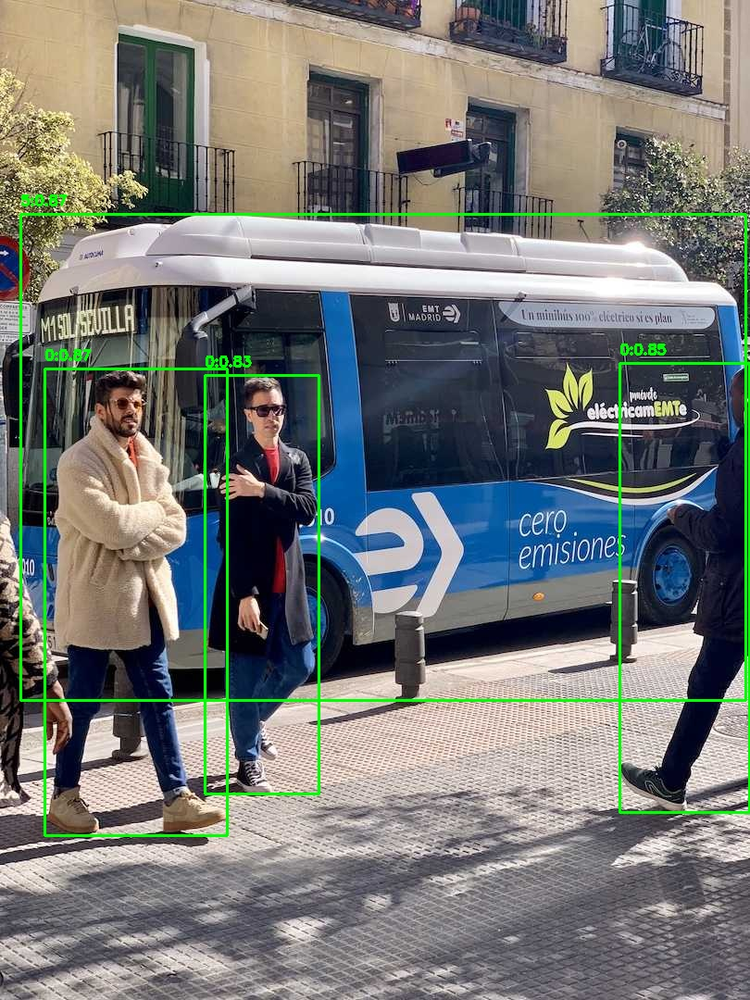

In [28]:
# ============================================================================
# CELL 8: TEST ON IMAGE FIRST (QUICK TEST)
# ============================================================================

# Quick test on a single image
from IPython.display import Image as IPImage, display
import urllib.request

# Download test image
print("📥 Downloading test image...")
urllib.request.urlretrieve(
    'https://ultralytics.com/images/bus.jpg',
    'test_image.jpg'
)

# Initialize detector
detector = YOLOv8Detector('yolov8n.pt', conf_threshold=0.5)

# Detect objects
frame = cv2.imread('test_image.jpg')
detections = detector.detect(frame)

print(f"✅ Found {len(detections)} objects")

# Draw detections
for det in detections:
    x1, y1, x2, y2, conf, cls = det
    cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
    cv2.putText(frame, f"{int(cls)}:{conf:.2f}", (int(x1), int(y1)-10),
               cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

cv2.imwrite('test_output.jpg', frame)
display(IPImage('test_output.jpg'))

In [29]:
# ============================================================================
# CELL 9: PROCESS YOUR VIDEO
# ============================================================================

# IMPORTANT: Replace with your actual video path!
video_path = '/kaggle/input/sample-video/64c61d29-a24b-455a-b544-8c7dd8a41088.mp4'

# Or use the sample video:
# video_path = 'sample_video.mp4'

# Check if video exists
if not os.path.exists(video_path):
    print(f"❌ Video not found: {video_path}")
    print("\nAvailable files in /kaggle/input/:")
    for root, dirs, files in os.walk('/kaggle/input/'):
        for file in files:
            print(f"  {os.path.join(root, file)}")
else:
    print(f"✅ Video found: {video_path}")
    
    # Initialize detector
    detector = YOLOv8Detector('yolov8n.pt', conf_threshold=0.5)
    
    # Process video (first 300 frames for quick test)
    tracker = process_video(
        video_path=video_path,
        detector=detector,
        output_path='output_tracking.mp4',
        max_frames=300  # Increase this for full video
    )
    
    # Display metrics
    metrics = tracker.get_metrics()
    print("\n📊 Performance Metrics:")
    print("="*50)
    for key, value in metrics.items():
        print(f"  {key:.<40} {value:.2f}")

✅ Video found: /kaggle/input/sample-video/64c61d29-a24b-455a-b544-8c7dd8a41088.mp4
Loading YOLOv8 model: yolov8n.pt
✅ YOLOv8 model loaded!
📹 Video: 1920x1080 @ 24fps
📊 Total frames: 121
🎯 Processing: 300 frames
💾 Output will be saved to: output_tracking.mp4
⏳ Processed 30 frames | FPS: 3.5
⏳ Processed 60 frames | FPS: 5.8
⏳ Processed 90 frames | FPS: 5.2
⏳ Processed 120 frames | FPS: 6.2

✅ Processing complete!
⏱️  Total time: 19.59s
📊 Average FPS: 6.18

📊 Performance Metrics:
  total_frames............................ 121.00
  total_detections........................ 755.00
  avg_detections_per_frame................ 6.24
  avg_detection_time...................... 12.69
  avg_tracking_time....................... 123.81
  avg_fps................................. 7.33


In [34]:
# ============================================================================
# CELL 10: DISPLAY OUTPUT VIDEO
# ============================================================================

from IPython.display import Video, HTML

# Display the output video
if os.path.exists('/kaggle/working/output_tracking.mp4'):
    print("🎬 Output Video:")
    display(Video('/kaggle/working/output_tracking.mp4', width=800, embed=True))
else:
    print("❌ Output video not found. Make sure processing completed successfully.")

🎬 Output Video:


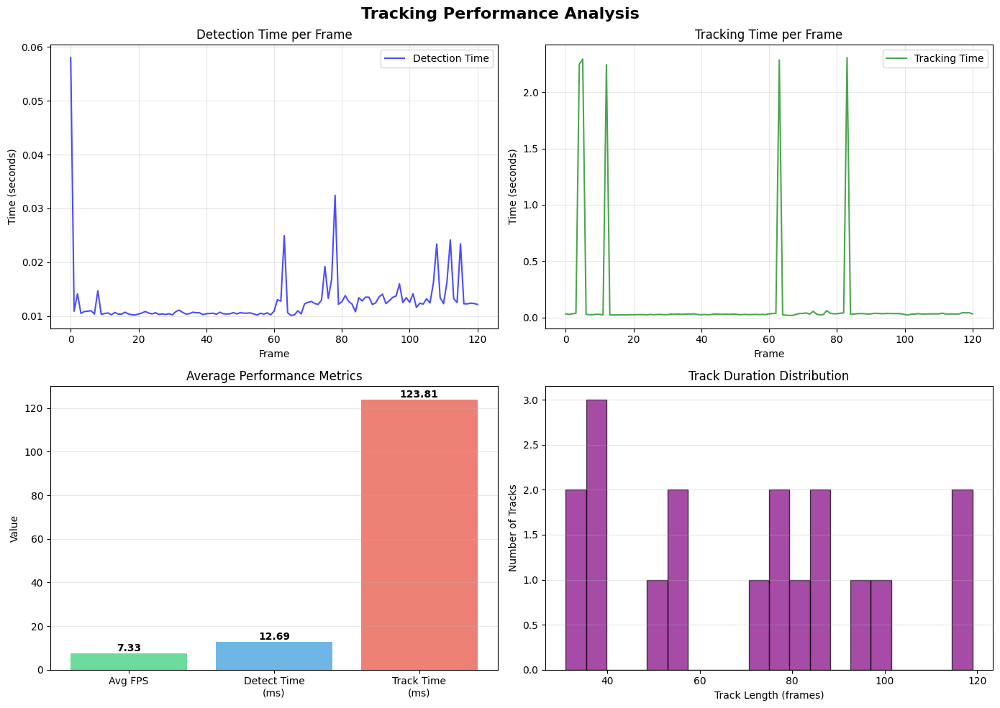


📊 Summary Statistics:
  Total unique tracks: 18
  Average track length: 69.2 frames
  Longest track: 119 frames


In [31]:
# ============================================================================
# CELL 11: VISUALIZE METRICS
# ============================================================================

def plot_metrics(tracker):
    """Plot performance metrics"""
    metrics = tracker.get_metrics()
    
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    fig.suptitle('Tracking Performance Analysis', fontsize=16, fontweight='bold')
    
    # Detection time over frames
    ax1 = axes[0, 0]
    ax1.plot(tracker.metrics['detection_time'], label='Detection Time', color='blue', alpha=0.7)
    ax1.set_xlabel('Frame')
    ax1.set_ylabel('Time (seconds)')
    ax1.set_title('Detection Time per Frame')
    ax1.grid(True, alpha=0.3)
    ax1.legend()
    
    # Tracking time over frames
    ax2 = axes[0, 1]
    ax2.plot(tracker.metrics['tracking_time'], label='Tracking Time', color='green', alpha=0.7)
    ax2.set_xlabel('Frame')
    ax2.set_ylabel('Time (seconds)')
    ax2.set_title('Tracking Time per Frame')
    ax2.grid(True, alpha=0.3)
    ax2.legend()
    
    # Average metrics bar chart
    ax3 = axes[1, 0]
    metric_names = ['Avg FPS', 'Detect Time\n(ms)', 'Track Time\n(ms)']
    metric_values = [
        metrics['avg_fps'],
        metrics['avg_detection_time'],
        metrics['avg_tracking_time']
    ]
    bars = ax3.bar(metric_names, metric_values, color=['#2ecc71', '#3498db', '#e74c3c'], alpha=0.7)
    ax3.set_title('Average Performance Metrics')
    ax3.set_ylabel('Value')
    ax3.grid(axis='y', alpha=0.3)
    
    # Add value labels on bars
    for bar in bars:
        height = bar.get_height()
        ax3.text(bar.get_x() + bar.get_width()/2., height,
               f'{height:.2f}',
               ha='center', va='bottom', fontweight='bold')
    
    # Track statistics
    ax4 = axes[1, 1]
    track_lengths = [len(history) for history in tracker.track_history.values()]
    if track_lengths:
        ax4.hist(track_lengths, bins=20, color='purple', alpha=0.7, edgecolor='black')
        ax4.set_xlabel('Track Length (frames)')
        ax4.set_ylabel('Number of Tracks')
        ax4.set_title('Track Duration Distribution')
        ax4.grid(axis='y', alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('tracking_metrics.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print("\n📊 Summary Statistics:")
    print(f"  Total unique tracks: {len(tracker.track_history)}")
    if track_lengths:
        print(f"  Average track length: {np.mean(track_lengths):.1f} frames")
        print(f"  Longest track: {max(track_lengths)} frames")

# Plot metrics
if 'tracker' in locals():
    plot_metrics(tracker)

In [32]:
# ============================================================================
# CELL 12: EXPORT RESULTS
# ============================================================================

import json

def export_results(tracker, output_file='tracking_results.json'):
    """Export tracking results to JSON"""
    
    metrics = tracker.get_metrics()
    
    results = {
        'metrics': metrics,
        'tracks': {
            str(track_id): {
                'length': len(positions),
                'positions': [(int(x), int(y)) for x, y in positions]
            }
            for track_id, positions in tracker.track_history.items()
        }
    }
    
    with open(output_file, 'w') as f:
        json.dump(results, f, indent=2)
    
    print(f"✅ Results exported to: {output_file}")
    
    # Create downloadable link
    from IPython.display import FileLink
    return FileLink(output_file)

# Export results
if 'tracker' in locals():
    export_results(tracker)

print("\n🎉 All done! Check the outputs above.")

✅ Results exported to: tracking_results.json

🎉 All done! Check the outputs above.
